# Cluster Comparison Figure

In [11]:
import numpy as np
import os
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
#from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
import contextily as ctx
#import ulmo
import datetime as dt
from datetime import datetime
#from shapely.geometry import Point
#import metloom
#from metloom.pointdata import CDECPointData
#from metloom.pointdata import SnotelPointData
#from metloom.variables import CdecStationVariables
import pickle
import scipy.stats as stats
# SVD function from scipy
from scipy.linalg import svd
import sklearn
from sklearn.cluster import KMeans

import rioxarray as rxr
import xarray as xr
import rasterio as rio
import matplotlib
#from mpl_toolkits.basemap import Basemap
#import regionmask

In [2]:
clusters_coarse = xr.open_dataset('../../data/reanalysis/swe_reanalysis_5clusters.nc').rio.write_crs('epsg:4326',inplace=True)
clusters_coarse = clusters_coarse.__xarray_dataarray_variable__

In [14]:
# clusters_highres = xr.open_dataset('../../data/swe_reanalysis_5clusters_highres.nc').rio.write_crs('epsg:4326',inplace=True)
# clusters_highres = clusters_highres.__xarray_dataarray_variable__

In [3]:
clusters_coarse.rio.crs

CRS.from_epsg(4326)

In [27]:
#clusters = xr.open_dataset('../../data/swe_reanalysis_5clusters.nc')

In [4]:
station_clusters = pickle.load(open('../../data/combined_snotel_cdec/station_clusters.pkl', 'rb'))

/var/folders/s4/pymynk_14w75x2ghv0xjkqlm0000gn/T/ipykernel_36397/4066474764.py:1: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  station_clusters = pickle.load(open('../../data/combined_snotel_cdec/station_clusters.pkl', 'rb'))


In [4]:
station_clusters

,name,network,elevation_m,geometry,cluster_anom
code,,,,,
301_CA_SNTL,Adin Mtn,SNOTEL,1886.712036,POINT Z (-120.79192 41.23583 1886.71204),3
302_OR_SNTL,Aneroid Lake #2,SNOTEL,2255.520020,POINT Z (-117.19258 45.21328 2255.52002),0
303_CO_SNTL,Apishapa,SNOTEL,3048.000000,POINT Z (-105.06749 37.33062 3048.00000),2
304_OR_SNTL,Arbuckle Mtn,SNOTEL,1758.696045,POINT Z (-119.25392 45.19085 1758.69604),0
306_ID_SNTL,Atlanta Summit,SNOTEL,2310.384033,POINT Z (-115.23907 43.75690 2310.38403),3
...,...,...,...,...,...
CRL,CHARLOTTE LAKE,CDEC,3169.920000,POINT Z (-118.42601 36.77752 10400.00000),2
CSV,CASA VIEJA MEADOWS,CDEC,2529.840000,POINT Z (-118.26769 36.19810 8300.00000),3
CAP,CAPLES LAKE,CDEC,2438.400000,POINT Z (-120.04158 38.71079 8000.00000),3


In [5]:
stations = pickle.load(open('../../data/snv_dataframes/snv_temp_precip_cluster_gdf_snvs_quantiles.pkl','rb'))

/var/folders/s4/pymynk_14w75x2ghv0xjkqlm0000gn/T/ipykernel_36397/4258488813.py:1: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  stations = pickle.load(open('../../data/snv_dataframes/snv_temp_precip_cluster_gdf_snvs_quantiles.pkl','rb'))


In [6]:
wstates = gpd.read_file('../../data/misc/western_states.shp')
#wstates_4326=wstates.to_crs('epsg:4326')

In [7]:
ucrb = pickle.load(open('../../data/misc/ucrb.pkl','rb'))

In [104]:
#clusters.rio.to_raster('../../data/swe_reanalysis_5clusters.tif')

In [13]:
#clusters_tif = rxr.open_rasterio('../../data/swe_reanalysis_5clusters.tif', masked=True).squeeze()

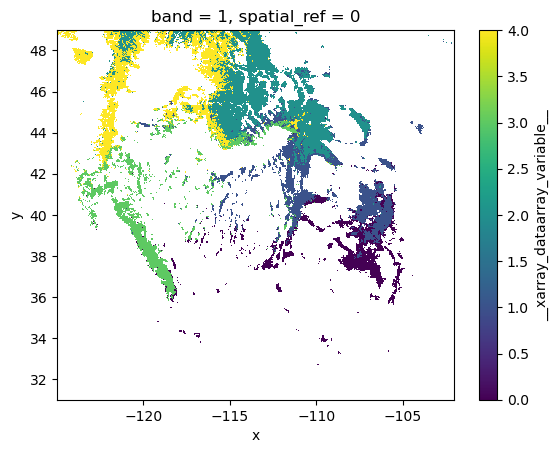

In [12]:
#clusters_tif.plot()

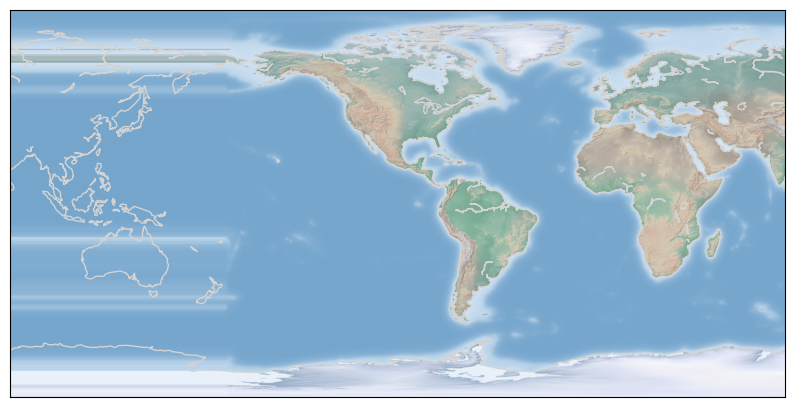

In [9]:
fig = plt.figure(figsize=(10, 8)) 
    lat_0=45, lon_0=-100, epsg='4326')
m.shadedrelief(scale=0.5)
# m.pcolormesh(lon, lat, temp_anomaly,
#              latlon=True, cmap='RdBu_r')
# plt.clim(-8, 8)
m.drawcoastlines(color='lightgray')

# plt.title('January 2014 Temperature Anomaly')
# plt.colorbar(label='temperature anomaly (°C)');

<Axes: >

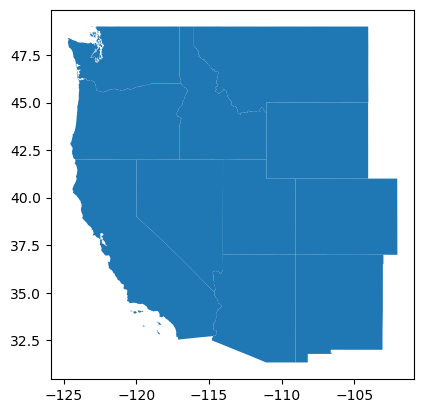

In [26]:
wstates.plot()

ValueError: y attribute access only provided for Point geometries

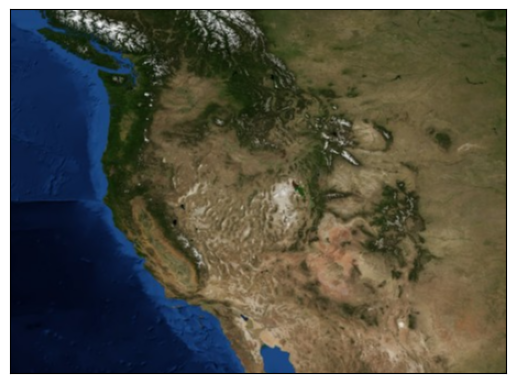

In [10]:
m = Basemap(projection=None, llcrnrlon = -130, llcrnrlat=30, urcrnrlon=-100, urcrnrlat=52,
            resolution='h', epsg=4326)
m.bluemarble()
m.scatter(stations.geometry.y, stations.geometry.x, c=stations['reanalysis_cluster'])
m.plot(wstates.geometry.y, wstates.geometry.x)
plt.show()

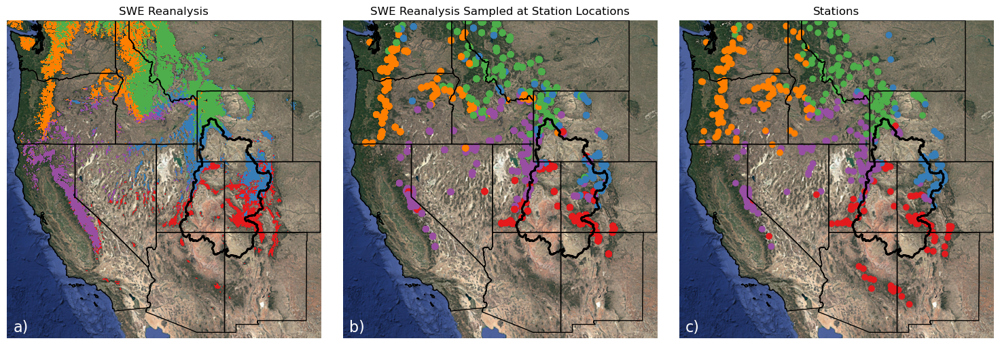

In [21]:
from matplotlib.colors import LinearSegmentedColormap
colors1=['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00'] #,'#ffff33'
cmap1 = LinearSegmentedColormap.from_list('clusters', colors1)
colors2=['#ff7f00','#4daf4a','#e41a1c','#984ea3','#377eb8'] #,'#ffff33'
cmap2 = LinearSegmentedColormap.from_list('clusters', colors2)


fig, ax = plt.subplots(1,3, figsize=(15,5))

clusters_coarse.plot(cmap = plt.get_cmap(cmap1, 6), ax=ax[0], add_colorbar=False)
ctx.add_basemap(ax=ax[0], crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', zoom=8, attribution=False)
wstates.plot(ax=ax[0], facecolor='none',edgecolor='k', linewidth=1)
ucrb.plot(ax=ax[0], facecolor='none', edgecolor='k', linewidth=2)
ax[0].set_xlim(-125,-102)
ax[0].set_ylim(31, 49)
ax[0].set_axis_off()
ax[0].annotate(text='a)', xy=(0.02,0.02), xycoords='axes fraction',fontsize=16, color='white')
ax[0].set_title('SWE Reanalysis')

stations.plot(ax=ax[1], column='reanalysis_cluster', cmap=cmap1)
ax[1].set_xlim(-125,-102)
ax[1].set_ylim(31, 49)
ctx.add_basemap(ax=ax[1], crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', zoom=8, attribution=False)
wstates.plot(ax=ax[1], facecolor='none',edgecolor='k', linewidth=1)
ucrb.plot(ax=ax[1], facecolor='none', edgecolor='k', linewidth=2)
ax[1].set_axis_off()
ax[1].annotate(text='b)', xy=(0.02,0.02), xycoords='axes fraction',fontsize=16, color='white')
ax[1].set_title('SWE Reanalysis Sampled at Station Locations')

station_clusters.plot(ax=ax[2], column='cluster_anom', cmap=cmap2)
ax[2].set_xlim(-125,-102)
ax[2].set_ylim(31, 49)
ctx.add_basemap(ax=ax[2], crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', zoom=8, attribution=False)
wstates.plot(ax=ax[2], facecolor='none',edgecolor='k', linewidth=1)
ucrb.plot(ax=ax[2], facecolor='none', edgecolor='k', linewidth=2)

ax[2].set_axis_off()
ax[2].annotate(text='c)', xy=(0.02,0.02), xycoords='axes fraction',fontsize=16, color='white')
ax[2].set_title('Stations')

plt.tight_layout()
plt.savefig('../../figures/cluster_comparison_3_3172025.jpeg', dpi=300)

Text(0.5, 1.0, 'Stations')

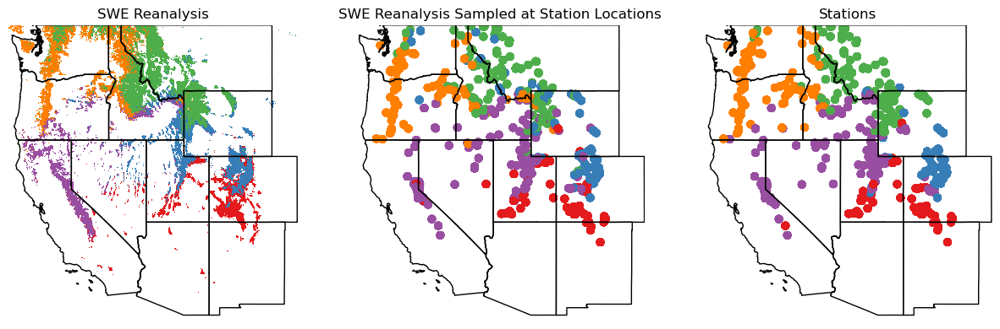

In [17]:
from matplotlib.colors import LinearSegmentedColormap
colors1=['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00'] #,'#ffff33'
cmap1 = LinearSegmentedColormap.from_list('clusters', colors1)
colors2=['#ff7f00','#4daf4a','#e41a1c','#984ea3','#377eb8'] #,'#ffff33'
cmap2 = LinearSegmentedColormap.from_list('clusters', colors2)


fig, ax = plt.subplots(1,3, figsize=(15,5))

clusters_coarse.plot(cmap = plt.get_cmap(cmap1, 6), ax=ax[0], add_colorbar=False)
#ctx.add_basemap(ax=ax[0], crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', zoom=8, attribution=False)
wstates_4326.plot(ax=ax[0], facecolor='none',edgecolor='k')
ax[0].set_xlim(-125,-102)
ax[0].set_ylim(31, 49)
ax[0].set_axis_off()
ax[0].annotate(text='A)', xy=(0.02,0.02), xycoords='axes fraction',fontsize=16, color='white')
ax[0].set_title('SWE Reanalysis')

stations.plot(ax=ax[1], column='reanalysis_cluster', cmap=cmap1)
ax[1].set_xlim(-125,-102)
ax[1].set_ylim(31, 49)
#ctx.add_basemap(ax=ax[1], crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', zoom=8, attribution=False)
wstates_4326.plot(ax=ax[1], facecolor='none',edgecolor='k')
ax[1].set_axis_off()
ax[1].annotate(text='B)', xy=(0.02,0.02), xycoords='axes fraction',fontsize=16, color='white')
ax[1].set_title('SWE Reanalysis Sampled at Station Locations')

stations.plot(ax=ax[2], column='cluster', cmap=cmap1)
ax[2].set_xlim(-125,-102)
ax[2].set_ylim(31, 49)
#ctx.add_basemap(ax=ax[2], crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', zoom=8, attribution=False)
wstates_4326.plot(ax=ax[2], facecolor='none',edgecolor='k')

ax[2].set_axis_off()
ax[2].annotate(text='C)', xy=(0.02,0.02), xycoords='axes fraction',fontsize=16, color='white')
ax[2].set_title('Stations')

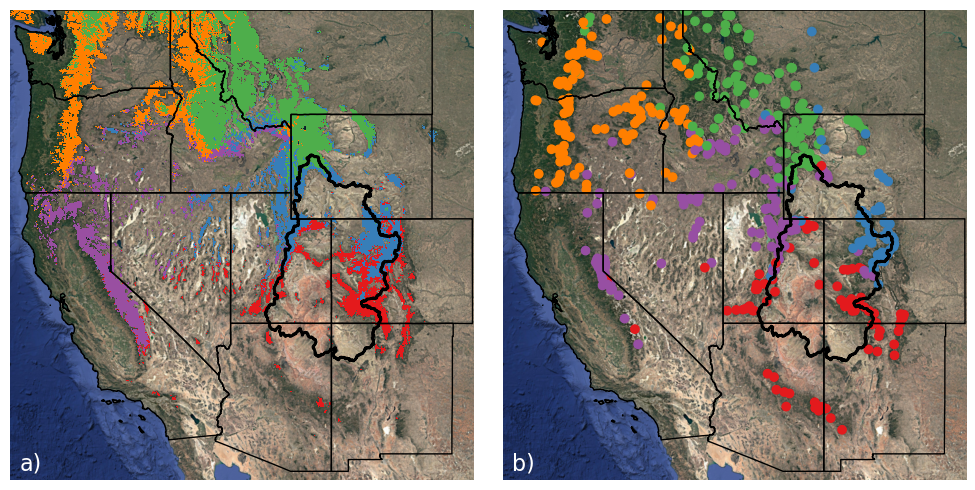

In [22]:
from matplotlib.colors import LinearSegmentedColormap
colors1=['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00'] #,'#ffff33'
cmap1 = LinearSegmentedColormap.from_list('clusters', colors1)
colors2=['#ff7f00','#4daf4a','#e41a1c','#984ea3','#377eb8'] #,'#ffff33'
cmap2 = LinearSegmentedColormap.from_list('clusters', colors2)


fig, ax = plt.subplots(1,2, figsize=(10,5))

clusters_coarse.plot(cmap = plt.get_cmap(cmap1, 6), ax=ax[0], add_colorbar=False)
ctx.add_basemap(ax=ax[0], crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', zoom=8, attribution=False)
wstates.plot(ax=ax[0], facecolor='none',edgecolor='k', linewidth=1)
ucrb.plot(ax=ax[0], facecolor='none', edgecolor='k', linewidth=2)
ax[0].set_xlim(-125,-102)
ax[0].set_ylim(31, 49)
ax[0].set_axis_off()
ax[0].annotate(text='a)', xy=(0.02,0.02), xycoords='axes fraction',fontsize=16, color='white')
ax[0].set_title('')

station_clusters.plot(ax=ax[1], column='cluster_anom', cmap=cmap2)
ax[1].set_xlim(-125,-102)
ax[1].set_ylim(31, 49)
ctx.add_basemap(ax=ax[1], crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', zoom=8, attribution=False)
wstates.plot(ax=ax[1], facecolor='none',edgecolor='k', linewidth=1)
ucrb.plot(ax=ax[1], facecolor='none', edgecolor='k', linewidth=2)

ax[1].set_axis_off()
ax[1].annotate(text='b)', xy=(0.02,0.02), xycoords='axes fraction',fontsize=16, color='white')
ax[1].set_title('')

plt.tight_layout()
plt.savefig('../../figures/cluster_comparison_2_3172025.jpeg', dpi=300)

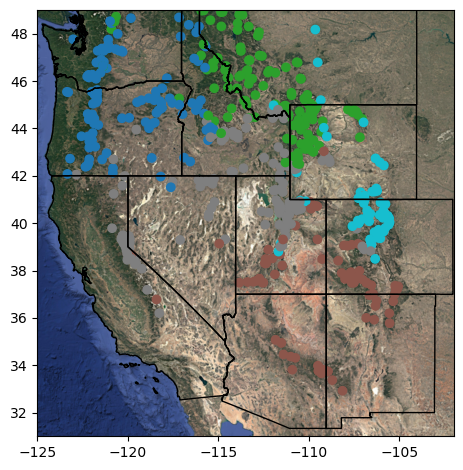

In [25]:
fig, ax = plt.subplots()

ax.set_xlim(-125,-102)
ax.set_ylim(31, 49)
station_clusters.plot(ax=ax, column='cluster_anom')
ctx.add_basemap(ax=ax, crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', zoom=8, attribution=False)
wstates.plot(ax=ax, facecolor='none',edgecolor='k', linewidth=1)

plt.tight_layout()

Text(0.5, 1.0, 'Stations')

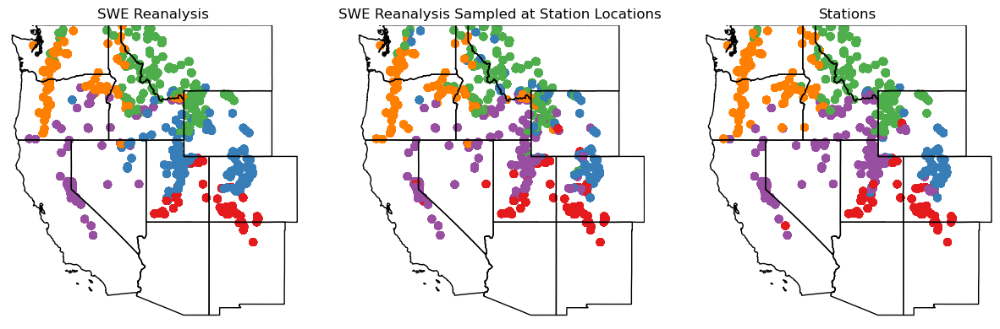

In [19]:
from matplotlib.colors import LinearSegmentedColormap
colors1=['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00'] #,'#ffff33'
cmap1 = LinearSegmentedColormap.from_list('clusters', colors1)
colors2=['#ff7f00','#4daf4a','#e41a1c','#984ea3','#377eb8'] #,'#ffff33'
cmap2 = LinearSegmentedColormap.from_list('clusters', colors2)


fig, ax = plt.subplots(1,3, figsize=(15,5))

stations.plot(ax=ax[0], column='sampled_reanalysis_cluster', cmap=cmap1)
#ctx.add_basemap(ax=ax[0], crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', zoom=8, attribution=False)
wstates_4326.plot(ax=ax[0], facecolor='none',edgecolor='k')
ax[0].set_xlim(-125,-102)
ax[0].set_ylim(31, 49)
ax[0].set_axis_off()
ax[0].annotate(text='A)', xy=(0.02,0.02), xycoords='axes fraction',fontsize=16, color='white')
ax[0].set_title('SWE Reanalysis')

stations.plot(ax=ax[1], column='reanalysis_cluster', cmap=cmap1)
ax[1].set_xlim(-125,-102)
ax[1].set_ylim(31, 49)
#ctx.add_basemap(ax=ax[1], crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', zoom=8, attribution=False)
wstates_4326.plot(ax=ax[1], facecolor='none',edgecolor='k')
ax[1].set_axis_off()
ax[1].annotate(text='B)', xy=(0.02,0.02), xycoords='axes fraction',fontsize=16, color='white')
ax[1].set_title('SWE Reanalysis Sampled at Station Locations')

stations.plot(ax=ax[2], column='cluster', cmap=cmap1)
ax[2].set_xlim(-125,-102)
ax[2].set_ylim(31, 49)
#ctx.add_basemap(ax=ax[2], crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', zoom=8, attribution=False)
wstates_4326.plot(ax=ax[2], facecolor='none',edgecolor='k')

ax[2].set_axis_off()
ax[2].annotate(text='C)', xy=(0.02,0.02), xycoords='axes fraction',fontsize=16, color='white')
ax[2].set_title('Stations')

### Compare both to station clusters:

'reanalysis_cluster' is the swe reanalysis sampled at the station locations and then clustered  
'sampled_reanalysis_cluster' is the swe reanlaysis clustered and then sampled at the station locations

In [23]:
stations['point_to_point_clusters'] = np.nan
stations['gridded_to_point_clusters'] = np.nan

# station_clusters['agree'] = 0

for i in stations.index:
    if stations.loc[i,'cluster'] == stations.loc[i,'reanalysis_cluster']:
        stations.loc[i,'point_to_point_clusters'] = 1
    else:
        stations.loc[i,'point_to_point_clusters'] = 0

In [30]:
for i in stations.index:
    if stations.loc[i,'cluster'] == stations.loc[i,'sampled_reanalysis_cluster']:
        stations.loc[i,'gridded_to_point_clusters'] = 1
    else:
        stations.loc[i,'gridded_to_point_clusters'] = 0

In [29]:
stations.point_to_point_clusters.sum() / len(stations.point_to_point_clusters)

0.7730337078651686

In [31]:
stations.gridded_to_point_clusters.sum() / len(stations.gridded_to_point_clusters)

0.7033707865168539

In [33]:
stations_ucrb = stations.clip(ucrb)

In [34]:
stations_ucrb.point_to_point_clusters.sum() / len(stations_ucrb.point_to_point_clusters)

0.7529411764705882

In [35]:
stations_ucrb.gridded_to_point_clusters.sum() / len(stations_ucrb.gridded_to_point_clusters)

0.7176470588235294

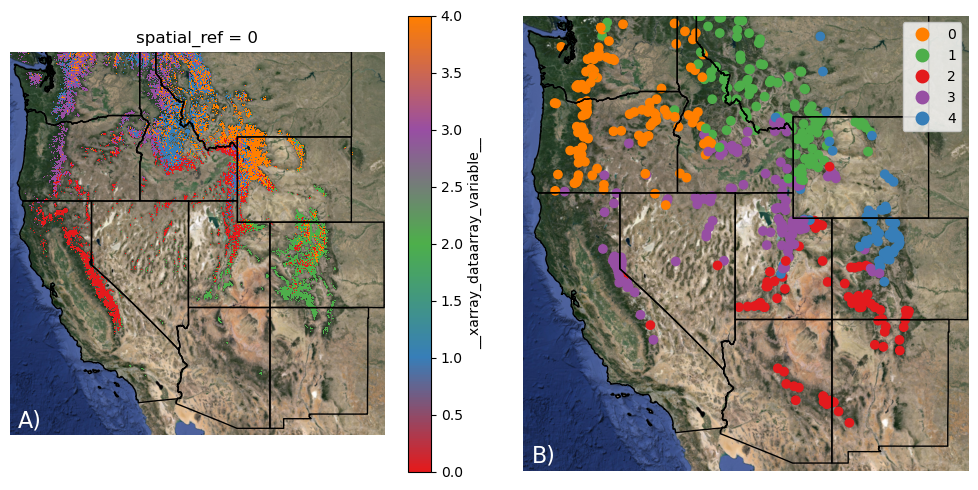

In [13]:
from matplotlib.colors import LinearSegmentedColormap
colors1=['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00'] #,'#ffff33'
cmap1 = LinearSegmentedColormap.from_list('clusters', colors1)
colors2=['#ff7f00','#4daf4a','#e41a1c','#984ea3','#377eb8'] #,'#ffff33'
cmap2 = LinearSegmentedColormap.from_list('clusters', colors2)

fig, ax = plt.subplots(1,2, figsize=(10,5))

clusters_highres.plot(cmap = plt.get_cmap(cmap1, 6), ax=ax[0], add_colorbar=True)
ctx.add_basemap(ax=ax[0], crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', zoom=8, attribution=False)
wstates_4326.plot(ax=ax[0], facecolor='none',edgecolor='k')
ax[1].set_xlim(-125,-102)
ax[1].set_ylim(31, 49)
ax[0].set_axis_off()
ax[0].annotate(text='A)', xy=(0.02,0.02), xycoords='axes fraction',fontsize=16, color='white')

station_clusters.plot(ax=ax[1], column='cluster_anom', cmap=cmap2, legend=True)
ctx.add_basemap(ax=ax[1], crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', zoom=8, attribution=False)
wstates_4326.plot(ax=ax[1], facecolor='none',edgecolor='k')
ax[1].set_xlim(-125,-102)
ax[1].set_ylim(31, 49)
ax[1].set_axis_off()
ax[1].annotate(text='B)', xy=(0.02,0.02), xycoords='axes fraction',fontsize=16, color='white')

plt.tight_layout()
#plt.savefig('../../figures/cluster_comparison.jpeg', dpi=300)

/var/folders/yr/1f67jccn6hl_lyxnqy7qjpq40000gp/T/ipykernel_1913/156414028.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  clusters.plot(cmap = plt.cm.get_cmap(cmap1, 6), ax=ax, add_colorbar=False)


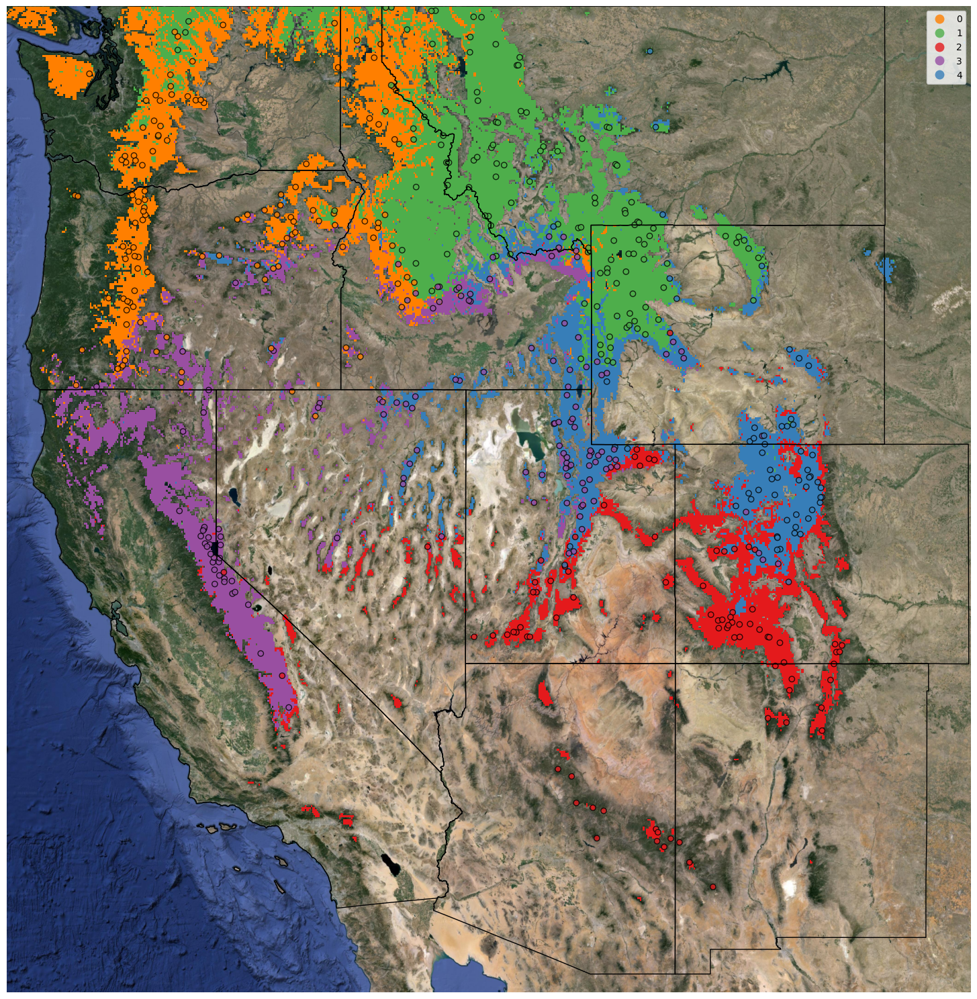

In [135]:
from matplotlib.colors import LinearSegmentedColormap
colors1=['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00'] #,'#ffff33'
cmap1 = LinearSegmentedColormap.from_list('clusters', colors1)
colors2=['#ff7f00','#4daf4a','#e41a1c','#984ea3','#377eb8'] #,'#ffff33'
cmap2 = LinearSegmentedColormap.from_list('clusters', colors2)

fig, ax = plt.subplots(figsize=(15,15))

clusters.plot(cmap = plt.get_cmap(cmap1, 6), ax=ax, add_colorbar=False)
station_clusters.plot(ax=ax, column='cluster_anom', cmap=cmap2, legend=True, edgecolor = 'k', alpha=0.8)
ctx.add_basemap(ax=ax, crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', zoom=8, attribution=False)
wstates_4326.plot(ax=ax, facecolor='none',edgecolor='k')
ax.set_xlim(-125,-102)
ax.set_ylim(31, 49)
ax.set_axis_off()
#ax[0].annotate(text='A)', xy=(0.02,0.02), xycoords='axes fraction',fontsize=16, color='white')

# station_clusters.plot(ax=ax[1], column='cluster_anom', cmap=cmap2, legend=True)
# ctx.add_basemap(ax=ax[1], crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', zoom=8, attribution=False)
# wstates_4326.plot(ax=ax[1], facecolor='none',edgecolor='k')
# ax[1].set_xlim(-125,-102)
# ax[1].set_ylim(31, 49)
# ax[1].set_axis_off()
# ax[1].annotate(text='B)', xy=(0.02,0.02), xycoords='axes fraction',fontsize=16, color='white')

plt.tight_layout()

In [51]:
station_clusters

,name,network,elevation_m,geometry,cluster_anom,cluster_sampled,code
code,,,,,,,
301_CA_SNTL,Adin Mtn,SNOTEL,1886.712036,POINT Z (-120.79192 41.23583 1886.71204),3,NaN,301_CA_SNTL
302_OR_SNTL,Aneroid Lake #2,SNOTEL,2255.520020,POINT Z (-117.19258 45.21328 2255.52002),0,2.496181,302_OR_SNTL
303_CO_SNTL,Apishapa,SNOTEL,3048.000000,POINT Z (-105.06749 37.33062 3048.00000),2,NaN,303_CO_SNTL
304_OR_SNTL,Arbuckle Mtn,SNOTEL,1758.696045,POINT Z (-119.25392 45.19085 1758.69604),0,NaN,304_OR_SNTL
306_ID_SNTL,Atlanta Summit,SNOTEL,2310.384033,POINT Z (-115.23907 43.75690 2310.38403),3,3.975497,306_ID_SNTL
...,...,...,...,...,...,...,...
CRL,CHARLOTTE LAKE,CDEC,3169.920000,POINT Z (-118.42601 36.77752 10400.00000),2,3.000000,CRL
CSV,CASA VIEJA MEADOWS,CDEC,2529.840000,POINT Z (-118.26769 36.19810 8300.00000),3,3.000000,CSV
CAP,CAPLES LAKE,CDEC,2438.400000,POINT Z (-120.04158 38.71079 8000.00000),3,3.000000,CAP


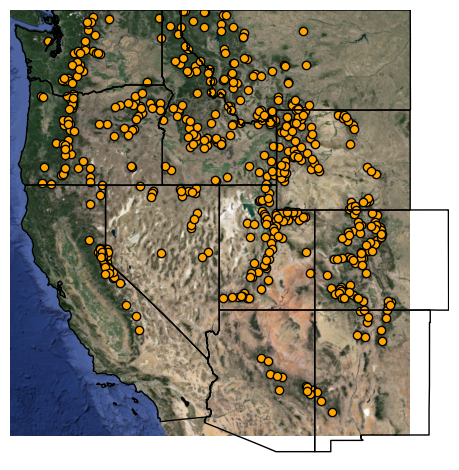

In [47]:
from matplotlib.colors import LinearSegmentedColormap
colors1=['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00'] #,'#ffff33'
cmap1 = LinearSegmentedColormap.from_list('clusters', colors1)
colors2=['#ff7f00','#4daf4a','#e41a1c','#984ea3','#377eb8'] #,'#ffff33'
cmap2 = LinearSegmentedColormap.from_list('clusters', colors2)

fig, ax = plt.subplots() #figsize=(15,15)

#clusters.plot(cmap = plt.get_cmap(cmap1, 6), ax=ax, add_colorbar=False)
station_clusters.plot(ax=ax,column='orange',edgecolor='k')
ctx.add_basemap(ax=ax, crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', zoom=8, attribution=False)
wstates_4326.plot(ax=ax, facecolor='none',edgecolor='k')
ax.set_xlim(-125,-102)
ax.set_ylim(31, 49)
ax.set_axis_off()
#ax[0].annotate(text='A)', xy=(0.02,0.02), xycoords='axes fraction',fontsize=16, color='white')

# station_clusters.plot(ax=ax[1], column='cluster_anom', cmap=cmap2, legend=True)
# ctx.add_basemap(ax=ax[1], crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', zoom=8, attribution=False)
# wstates_4326.plot(ax=ax[1], facecolor='none',edgecolor='k')
# ax[1].set_xlim(-125,-102)
# ax[1].set_ylim(31, 49)
# ax[1].set_axis_off()
# ax[1].annotate(text='B)', xy=(0.02,0.02), xycoords='axes fraction',fontsize=16, color='white')

plt.tight_layout()
plt.savefig('../../figures/snotel_sites.png',dpi=300)

In [67]:
swe_colors = {'red':0, 'blue':1, 'green':2, 'purple':3, 'orange':4}
snotel_colors = {'orange':0, 'green':1, 'red':2, 'purple':3, 'blue':4}
swe_to_snotel = {-1:-1, 0:2, 1:4, 2:1, 3:3, 4:0}

In [10]:
import core

In [11]:
coord = [(pt.x, pt.y) for pt in station_clusters.geometry]

In [12]:
# This function was written by Friedrich Knuth, UW and is contained in core.py
# The sampling technique can be specified, here we use bicubic

cluster_sample = core.interpolate('../../data/swe_reanalysis_5clusters.tif', coord, offset=3, kind='linear')

In [13]:
station_clusters['cluster_sampled'] = cluster_sample

In [14]:
station_clusters.index = station_clusters.index.astype('string')

In [15]:
swe_to_snotel

{-1: -1, 0: 2, 1: 4, 2: 1, 3: 3, 4: 0}

In [16]:
np.isnan(station_clusters['cluster_sampled']).sum()

195

In [17]:
195*32

6240

In [18]:
station_clusters['cluster_sampled'] = station_clusters['cluster_sampled'].fillna(-1)

In [19]:
station_clusters['agree'] = 0

for i in station_clusters.index:
    if station_clusters.loc[i,'cluster_anom'] == swe_to_snotel[int(station_clusters.loc[i,'cluster_sampled'])]:
        station_clusters.loc[i,'agree'] = 1
    else:
        station_clusters.loc[i,'agree'] = 0
    

In [20]:
station_clusters['agree'].sum() / len(station_clusters['agree']) * 100

36.007827788649706

In [21]:
count_list = []
for i in station_clusters.index:
    if station_clusters.loc[i,'cluster_sampled'] == -1:
        count_list.append(1)
    else:
        continue
    

In [22]:
len(count_list) / len(station_clusters['cluster_sampled'])

0.3816046966731898

In [23]:
purple_agree = []
re_purple = []
station_purple = []

for i in station_clusters.index:
    if (station_clusters.loc[i,'cluster_anom'] == 3) & (station_clusters.loc[i,'cluster_sampled'] == 3):
        purple_agree.append(1)

for i in station_clusters.index:
    if (station_clusters.loc[i,'cluster_sampled'] == 3):
        re_purple.append(1)

for i in station_clusters.index:
    if (station_clusters.loc[i,'cluster_anom'] == 3):
        station_purple.append(1)

In [24]:
print(len(purple_agree))
print(len(re_purple))
print(len(station_purple))

11
12
136


In [25]:
station_clusters['cluster_sampled_conv'] = ''

for i in station_clusters.index:
    if station_clusters.loc[i,'cluster_sampled'] in swe_to_snotel.keys():
        station_clusters.loc[i,'cluster_sampled_conv'] = swe_to_snotel[int(station_clusters.loc[i,'cluster_sampled'])]
    else:
        station_clusters.loc[i,'cluster_sampled_conv'] = np.nan

In [ ]:
from matplotlib.colors import LinearSegmentedColormap
colors1=['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00'] #,'#ffff33'
cmap1 = LinearSegmentedColormap.from_list('clusters', colors1)
colors2=['#ff7f00','#4daf4a','#e41a1c','#984ea3','#377eb8'] #,'#ffff33'
cmap2 = LinearSegmentedColormap.from_list('clusters', colors2)

fig, ax = plt.subplots(1,2, figsize=(10,5))

clusters.plot(cmap = plt.get_cmap(cmap1, 6), ax=ax[0], add_colorbar=True)
ctx.add_basemap(ax=ax[0], crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', zoom=8, attribution=False)
wstates_4326.plot(ax=ax[0], facecolor='none',edgecolor='k')
ax[1].set_xlim(-125,-102)
ax[1].set_ylim(31, 49)
ax[0].set_axis_off()
ax[0].annotate(text='A)', xy=(0.02,0.02), xycoords='axes fraction',fontsize=16, color='white')

station_clusters.plot(ax=ax[1], column='cluster_anom', cmap=cmap2, legend=True)
ctx.add_basemap(ax=ax[1], crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', zoom=8, attribution=False)
wstates_4326.plot(ax=ax[1], facecolor='none',edgecolor='k')
ax[1].set_xlim(-125,-102)
ax[1].set_ylim(31, 49)
ax[1].set_axis_off()
ax[1].annotate(text='B)', xy=(0.02,0.02), xycoords='axes fraction',fontsize=16, color='white')

plt.tight_layout()

In [144]:
station_clusters.head()

,name,network,elevation_m,geometry,cluster_anom,cluster_sampled,agree,cluster_sampled_conv
code,,,,,,,,
301_CA_SNTL,Adin Mtn,SNOTEL,1886.712036,POINT Z (-120.79192 41.23583 1886.71204),3,3.0,1,3
302_OR_SNTL,Aneroid Lake #2,SNOTEL,2255.520020,POINT Z (-117.19258 45.21328 2255.52002),0,2.0,0,1
303_CO_SNTL,Apishapa,SNOTEL,3048.000000,POINT Z (-105.06749 37.33062 3048.00000),2,0.0,1,2
304_OR_SNTL,Arbuckle Mtn,SNOTEL,1758.696045,POINT Z (-119.25392 45.19085 1758.69604),0,3.0,0,3
306_ID_SNTL,Atlanta Summit,SNOTEL,2310.384033,POINT Z (-115.23907 43.75690 2310.38403),3,2.0,0,1


In [145]:
len(station_clusters)

511

In [157]:
snotel_colors

{'orange': 0, 'green': 1, 'red': 2, 'purple': 3, 'blue': 4}

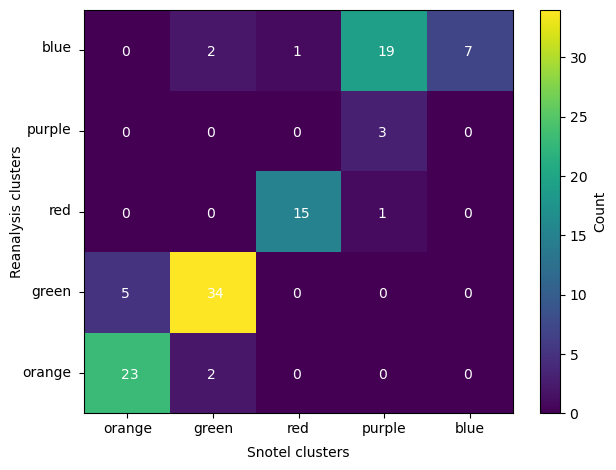

In [26]:
fig, ax = plt.subplots()

BINS = [-0.5,0.5,1.5,2.5,3.5,4.5]

sm = ax.hist2d(station_clusters[station_clusters['cluster_sampled_conv'] != -1]['cluster_anom'], \
        station_clusters[station_clusters['cluster_sampled_conv'] != -1]['cluster_sampled_conv'], 
               bins=BINS) 

# below code from https://www.reddit.com/r/learnpython/comments/j5bk91/2d_histogram_bin_count/
for ix, x_pos in enumerate(sm[1][0:5]):
    for iy, y_pos in enumerate(sm[2][0:5]):
        label = int(sm[0][ix][iy])
        # print(f"bin({int(x_pos)},{int(y_pos)}): {int(label)}")
        plt.text(x_pos+0.425, y_pos+0.425, label, color='w')

bin_colors = ['orange', 'green','red', 'purple','blue']
for x, label in zip(BINS, bin_colors):
    # Label the raw counts
    ax.annotate(label, xy=(x+0.5, 0.04), xycoords=('data', 'axes fraction'),
        xytext=(0, -18), textcoords='offset points', va='top', ha='center')

for y, label in zip(BINS, bin_colors):
    # Label the raw counts
    ax.annotate(label, xy=(-0.65, (y/4.97 + 0.28)), xycoords=('data', 'axes fraction'),
        xytext=(0, -18), textcoords='offset points', va='top', ha='right')
# for y, label in zip(BINS, bin_colors):    
#     ax.annotate(label, xy=(0.05,y+0.5)), xycoords=('data','axes fraction'), 
#         xytext=(0,-18), textcoords='offset points', va='top', ha='center')
ax.set_xlabel('Snotel clusters',labelpad=20)
ax.set_ylabel('Reanalysis clusters',labelpad=40)
#ax.set_axis_off()
ax.tick_params(labelbottom=False) 
ax.tick_params(labelleft=False) 
cbar = fig.colorbar(sm[3], ax=ax, format=matplotlib.ticker.ScalarFormatter())
cbar.set_label("Count")
plt.tight_layout()
plt.savefig('../../figures/station_heatmap.jpeg',dpi=300)

The majority of stations are categorized in the same clusters. The one mismatch that stands out is where snotel had many stations in the purple cluster whereas reanalysis had them in the blue cluster.

In [108]:
clusters_tif_fn = '../../data/swe_reanalysis_5clusters.tif'

In [109]:
from rasterio import features

dnr_feat_list = []
#ovr_scale = 8
#dt_fieldnum = 4
src = rio.open(clusters_tif_fn)
a = src.read(1, masked=True)
mask = np.ma.getmaskarray(a).astype(np.uint8) - 1
shapes = features.shapes(a.astype('int16'), mask=mask, transform=src.transform)
geom_list = list(shapes)
#dt = os.path.splitext(os.path.split(dnr_fn)[-1])[0].split('_')[dt_fieldnum]
dnr_feat_list.extend([{'properties':{'date':'2017', 'cluster':i[1]}, 'geometry':i[0]} for i in geom_list]) #



#dnr_gdf = gpd.GeoDataFrame.from_features(dnr_feat_list, crs=src.crs)
cluster_gdf = gpd.GeoDataFrame.from_features(dnr_feat_list, crs=src.crs)



/Users/Hannah/micromamba/envs/analysis_2023/lib/python3.9/site-packages/numpy/ma/core.py:467: RuntimeWarning: invalid value encountered in cast
  fill_value = np.array(fill_value, copy=False, dtype=ndtype)
/var/folders/yr/1f67jccn6hl_lyxnqy7qjpq40000gp/T/ipykernel_4537/3062735003.py:9: RuntimeWarning: invalid value encountered in cast
  shapes = features.shapes(a.astype('int16'), mask=mask, transform=src.transform)


In [111]:
src.transform

Affine(0.035556692670482073, 0.0, -124.99999041298562,
       0.0, 0.035555414634175816, 31.000071261188772)

In [112]:
cluster_gdf

,geometry,date,cluster
0,"POLYGON ((-109.88840 32.67118, -109.88840 32.7...",2017,0.0
1,"POLYGON ((-108.60836 33.24006, -108.60836 33.2...",2017,0.0
2,"POLYGON ((-108.71503 33.24006, -108.71503 33.3...",2017,0.0
3,"POLYGON ((-105.83493 33.34673, -105.83493 33.4...",2017,0.0
4,"POLYGON ((-109.39060 33.56006, -109.39060 33.5...",2017,0.0
...,...,...,...
3123,"POLYGON ((-115.47080 48.49334, -115.47080 48.5...",2017,2.0
3124,"POLYGON ((-114.97300 48.49334, -114.97300 48.5...",2017,4.0
3125,"POLYGON ((-115.04412 48.95556, -115.04412 48.9...",2017,4.0
3126,"POLYGON ((-114.68855 43.58669, -114.68855 43.6...",2017,2.0


In [117]:
from matplotlib.colors import LinearSegmentedColormap
colors1=['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00'] #,'#ffff33'
cmap1 = LinearSegmentedColormap.from_list('clusters', colors1)

/var/folders/yr/1f67jccn6hl_lyxnqy7qjpq40000gp/T/ipykernel_4537/1972707617.py:1: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cluster_gdf.plot(column='cluster', facecolor='none', cmap = plt.cm.get_cmap(cmap1, 6))


<Axes: >

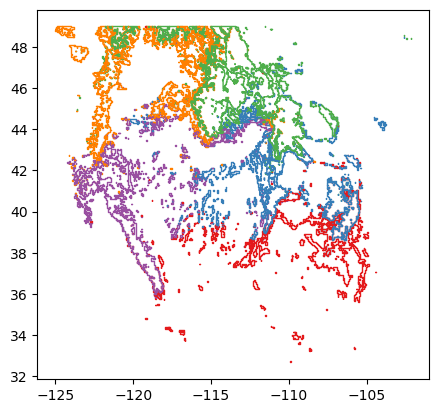

In [118]:
cluster_gdf.plot(column='cluster', facecolor='none', cmap = plt.get_cmap(cmap1, 6))

In [116]:
cluster_gdf.to_file('../../data/cluster_polygons.geojson', driver='GeoJSON')

In [28]:
station_clusters.head(2)

,name,network,elevation_m,geometry,cluster_anom,cluster_sampled
code,,,,,,
301_CA_SNTL,Adin Mtn,SNOTEL,1886.712036,POINT Z (-120.79192 41.23583 1886.71204),3,NaN
302_OR_SNTL,Aneroid Lake #2,SNOTEL,2255.520020,POINT Z (-117.19258 45.21328 2255.52002),0,2.496181


In [49]:
station_clusters['code'] = station_clusters.index

In [33]:
import altair as alt

In [39]:
alt.Chart(station_clusters).mark_geoshape()

alt.Chart(...)

In [50]:
alt.Chart(station_clusters).mark_geoshape().encode(
    # longitude='geometry.x:Q',
    # latitude='geometry.y:Q',
    color='cluster_anom',
    tooltip='code'
).project(
    "albersUsa"
).properties(
    width=800,
    height=600
)


alt.Chart(...)

### Rerun the above analysis for the snotel station locations with > 0.1 mean swe:

### Sample the reanalysis cluster data at the location of each snotel:

In [4]:
stations = pickle.load(open('../../data/snv_dataframes/snv_temp_precip_cluster_gdf.pkl','rb'))

In [8]:
clusters_reanalysis = rxr.open_rasterio('../../data/swe_reanalysis_5clusters.nc', masked=True).squeeze()

/Users/Hannah/micromamba/envs/analysis_2024/lib/python3.12/site-packages/rioxarray/_io.py:1132: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  warnings.warn(str(rio_warning.message), type(rio_warning.message))  # type: ignore


In [9]:
clusters_reanalysis = clusters_reanalysis.rio.write_crs('epsg:4326')

In [10]:
stations_1yr = stations[stations.index.get_level_values(1)==1990]

In [11]:
xs = stations_1yr.geometry.x.values
ys = stations_1yr.geometry.y.values

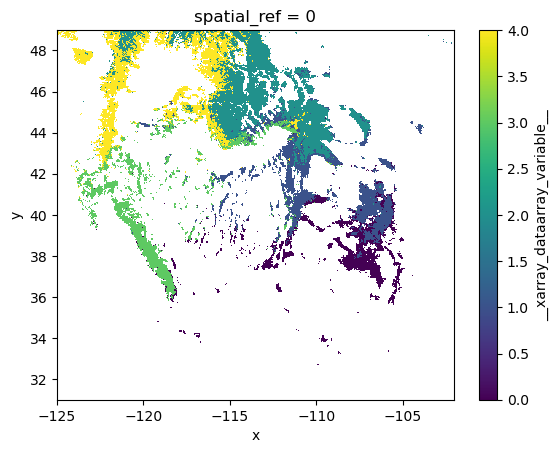

In [17]:
clusters_coarse.plot()

In [18]:
sampled_reanalysis_clusters = clusters_coarse.interp(x=xs, y=ys, method='nearest').values

In [21]:
stations_1yr['sampled_reanalysis_clusters'] = sampled_reanalysis_clusters.diagonal()

/Users/Hannah/micromamba/envs/analysis_2024/lib/python3.12/site-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


<Axes: >

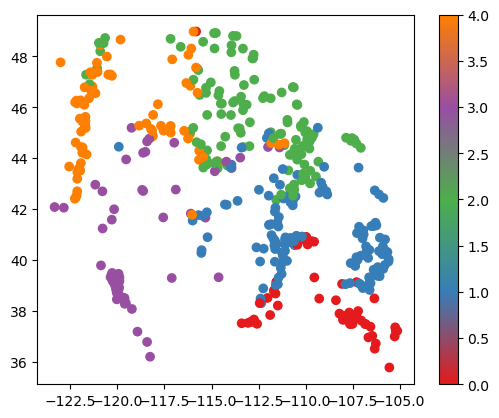

In [66]:
from matplotlib.colors import LinearSegmentedColormap
colors1=['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00'] #,'#ffff33'
cmap1 = LinearSegmentedColormap.from_list('clusters', colors1)

stations_1yr.plot(column='sampled_reanalysis_clusters', facecolor='none', cmap = plt.get_cmap(cmap1, 6), vmin=0,vmax=4, legend=True)

<Axes: >

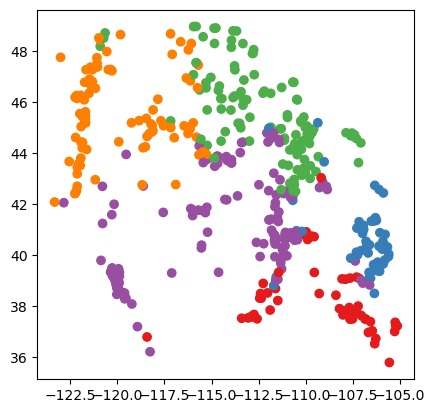

In [50]:
from matplotlib.colors import LinearSegmentedColormap
colors1=['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00'] #,'#ffff33'
cmap1 = LinearSegmentedColormap.from_list('clusters', colors1)

stations_1yr.plot(column='cluster', facecolor='none', cmap = plt.get_cmap(cmap1, 6))

In [23]:
stations_1yr.shape

(445, 29)

In [24]:
stations_1yr.columns

Index(['station_n', 'reanalysis_n', 'elevation_m', 'station_swe',
       'station_swe_mean', 'reanalysis_swe', 'deg_days_0C', 'cold_deg_days',
       'cumulative_precip_m', 'precip_mean', 'precip_std', 'precip_n',
       'log_cumulative_precip_m', 'log_reanalysis_swe', 'log_station_swe',
       'log_precip_mean', 'log_station_swe_mean', 'log_reanalysis_swe_mean',
       'log_precip_std', 'log_station_swe_std', 'log_reanalysis_swe_std',
       'log_precip_n', 'log_station_n', 'log_reanalysis_n', 'latitude',
       'longitude', 'geometry', 'cluster', 'reanalysis_clusters'],
      dtype='object')

In [36]:
len(stations.loc[pd.IndexSlice[site, :], 'sampled_reanalysis_cluster'])

32

In [39]:
np.full((1, 32), stations_1yr.loc[stations_1yr.index.get_level_values(0)==site, 'sampled_reanalysis_clusters'].values, dtype=int)

array([[3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
        3, 3, 3, 3, 3, 3, 3, 3, 3, 3]])

In [44]:
stations_1yr.loc[stations_1yr.index.get_level_values(0)==site, 'sampled_reanalysis_clusters'].values

array([3.])

In [45]:
stations['sampled_reanalysis_cluster'] = np.nan
for site in stations_1yr.index.get_level_values(0):
    for year in range(1990,2022):
        stations.loc[pd.IndexSlice[site, year], 'sampled_reanalysis_cluster'] = stations_1yr.loc[stations_1yr.index.get_level_values(0)==site, 'sampled_reanalysis_clusters'].values

In [46]:
stations

station_n  reanalysis_n  elevation_m  station_swe  \
station     year                                                      
301_CA_SNTL 1990  -0.492262     -0.194751  1886.712036     0.193040   
            1991  -0.806681      0.193222  1886.712036     0.142240   
            1992  -1.639892     -1.097426  1886.712036     0.007620   
            1993   0.938344     -0.578276  1886.712036     0.424180   
            1994  -0.335053     -0.422643  1886.712036     0.218440   
...                     ...           ...          ...          ...   
BLD         2017   0.619445      1.160298  2194.560000     1.033272   
            2018  -0.806206     -1.171988  2194.560000     0.371856   
            2019   0.501188      1.293572  2194.560000     0.978408   
            2020  -0.615681     -0.258835  2194.560000     0.460248   
            2021  -0.418586     -0.760679  2194.560000     0.551688   

                  station_swe_mean  reanalysis_swe  deg_days_0C  \
station     year                                                  
301_CA_SNTL 1990          0.272574          0.1718         57.0   
            1991          0.272574          0.2416         47.0   
            1992          0.272574          0.0094         64.0   
            1993          0.272574          0.1028         42.0   
            1994          0.272574          0.1308         48.0   
...                            ...             ...          ...   
BLD         2017          0.745887          1.1946         54.0   
            2018          0.745887          0.1796         82.0   
            2019          0.745887          1.2526         59.0   
            2020          0.745887          0.5770         68.0   
            2021          0.745887          0.3586         55.0   

                  cold_deg_days  cumulative_precip_m  precip_mean  ...  \
station     year                                                   ...   
301_CA_SNTL 1990            0.0             0.223842     0.332045  ...   
            1991            0.0             0.237158     0.332045  ...   
            1992            0.0             0.197154     0.332045  ...   
            1993            0.0             0.449491     0.332045  ...   
            1994            0.0             0.223718     0.332045  ...   
...                         ...                  ...          ...  ...   
BLD         2017            0.0             1.722192     0.846466  ...   
            2018            0.0             0.807857     0.846466  ...   
            2019            0.0             1.363057     0.846466  ...   
            2020            0.0             0.671916     0.846466  ...   
            2021            0.0             0.578816     0.846466  ...   

                  log_station_swe_std  log_reanalysis_swe_std  log_precip_n  \
station     year                                                              
301_CA_SNTL 1990                  NaN                     NaN     -1.079449   
            1991                  NaN                     NaN     -0.898522   
            1992                  NaN                     NaN     -1.476953   
            1993                  NaN                     NaN      1.103428   
            1994                  NaN                     NaN     -1.081188   
...                               ...                     ...           ...   
BLD         2017             0.751098                     NaN      2.070124   
            2018             0.751098                     NaN      0.060523   
            2019             0.751098                     NaN      1.449251   
            2020             0.751098                     NaN     -0.428631   
            2021             0.751098                     NaN     -0.824592   

                  log_station_n  log_reanalysis_n   latitude   longitude  \
station     year                                                           
301_CA_SNTL 1990            NaN               NaN  41.235828 -120.791924   
   

In [71]:
stations = stations.rename(columns={'reanalysis_cluster':'sampled_reanalysis_cluster'})

### Save this sampled data:

In [73]:
stations.to_pickle('../../data/snv_dataframes/snv_temp_precip_cluster_gdf_snvs.pkl')

### Remake the heatmap comparison chart with updated data:

In [9]:
stations = pickle.load(open('../../data/snv_dataframes/snv_temp_precip_cluster_gdf_snvs.pkl','rb'))

In [10]:
stations_1yr = stations[stations.index.get_level_values(1)==1990]

In [11]:
stations_1yr['sampled_reanalysis_cluster'] = stations_1yr['sampled_reanalysis_cluster'].fillna(-1)

/Users/Hannah/micromamba/envs/analysis_2024/lib/python3.12/site-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [12]:
stations_1yr = stations_1yr.droplevel(1)

In [13]:
stations_1yr.index = stations_1yr.index.astype('string')

In [14]:
stations_1yr['agree'] = 0

for i in stations_1yr.index:
    if stations_1yr.loc[i,'cluster'] == stations_1yr.loc[i,'sampled_reanalysis_cluster']:
        stations_1yr.loc[i,'agree'] = 1
    else:
        stations_1yr.loc[i,'agree'] = 0
    

In [15]:
stations_1yr['agree'].sum() / len(stations_1yr['agree']) * 100

70.33707865168539

In [62]:
stations_1yr.columns

Index(['station_n', 'reanalysis_n', 'elevation_m', 'station_swe',
       'station_swe_mean', 'reanalysis_swe', 'deg_days_0C', 'cold_deg_days',
       'cumulative_precip_m', 'precip_mean', 'precip_std', 'precip_n',
       'log_cumulative_precip_m', 'log_reanalysis_swe', 'log_station_swe',
       'log_precip_mean', 'log_station_swe_mean', 'log_reanalysis_swe_mean',
       'log_precip_std', 'log_station_swe_std', 'log_reanalysis_swe_std',
       'log_precip_n', 'log_station_n', 'log_reanalysis_n', 'latitude',
       'longitude', 'geometry', 'cluster', 'sampled_reanalysis_cluster',
       'reanalysis_cluster', 'agree', 'agree_st'],
      dtype='object')

In [63]:
stations_1yr['agree_st'] = 0

for i in stations_1yr.index:
    if stations_1yr.loc[i,'cluster'] == stations_1yr.loc[i,'reanalysis_cluster']:
        stations_1yr.loc[i,'agree_st'] = 1
    else:
        stations_1yr.loc[i,'agree_st'] = 0

In [68]:
stations_1yr['agree_st'].sum() / len(stations_1yr['agree_st']) * 100

77.30337078651685

In [20]:
ucrb.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

### Calculate percent agreement within UCRB:

In [48]:
from shapely.geometry import Polygon

In [65]:
stations_1yr_ucrb = gpd.overlay(stations_1yr, ucrb, how='intersection')

#### Agree = clusters from sampled reanalysis and snotel

In [66]:
stations_1yr_ucrb['agree'].sum() / len(stations_1yr_ucrb['agree']) * 100

71.76470588235294

### Agree_st = clusters from whole reanalysis and snotel

In [67]:
stations_1yr_ucrb['agree_st'].sum() / len(stations_1yr_ucrb['agree_st']) * 100

75.29411764705883

In [118]:
count_list = []
for i in stations_1yr.index:
    if stations_1yr.loc[i,'sampled_reanalysis_cluster'] == -1:
        count_list.append(1)
    else:
        continue
    

In [119]:
len(count_list) / len(stations_1yr['sampled_reanalysis_cluster'])

0.0022471910112359553

In [120]:
swe_colors = {'red':0, 'blue':1, 'green':2, 'purple':3, 'orange':4}

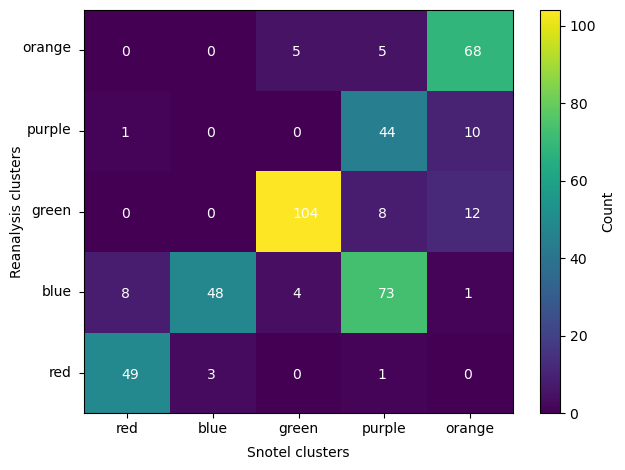

In [121]:
fig, ax = plt.subplots()

BINS = [-0.5,0.5,1.5,2.5,3.5,4.5]

sm = ax.hist2d(stations_1yr[stations_1yr['sampled_reanalysis_cluster'] != -1]['cluster'], \
        stations_1yr[stations_1yr['sampled_reanalysis_cluster'] != -1]['sampled_reanalysis_cluster'], 
               bins=BINS,) 

# below code from https://www.reddit.com/r/learnpython/comments/j5bk91/2d_histogram_bin_count/
for ix, x_pos in enumerate(sm[1][0:5]):
    for iy, y_pos in enumerate(sm[2][0:5]):
        label = int(sm[0][ix][iy])
        # print(f"bin({int(x_pos)},{int(y_pos)}): {int(label)}")
        plt.text(x_pos+0.425, y_pos+0.425, label, color='w')

bin_colors = ['red', 'blue','green', 'purple','orange']
for x, label in zip(BINS, bin_colors):
    # Label the raw counts
    ax.annotate(label, xy=(x+0.5, 0.04), xycoords=('data', 'axes fraction'),
        xytext=(0, -18), textcoords='offset points', va='top', ha='center')

for y, label in zip(BINS, bin_colors):
    # Label the raw counts
    ax.annotate(label, xy=(-0.65, (y/4.97 + 0.28)), xycoords=('data', 'axes fraction'),
        xytext=(0, -18), textcoords='offset points', va='top', ha='right')
# for y, label in zip(BINS, bin_colors):    
#     ax.annotate(label, xy=(0.05,y+0.5)), xycoords=('data','axes fraction'), 
#         xytext=(0,-18), textcoords='offset points', va='top', ha='center')
ax.set_xlabel('Snotel clusters',labelpad=20)
ax.set_ylabel('Reanalysis clusters',labelpad=40)
#ax.set_axis_off()
ax.tick_params(labelbottom=False) 
ax.tick_params(labelleft=False) 
cbar = fig.colorbar(sm[3], ax=ax, format=matplotlib.ticker.ScalarFormatter())
cbar.set_label("Count")
plt.tight_layout()
#plt.savefig('../../figures/station_heatmap.jpeg',dpi=300)

### Remake Heatmap with clusters from reanalysis only at snotel sites:

In [122]:
stations = pickle.load(open('../../data/snv_dataframes/snv_temp_precip_cluster_gdf_snvs.pkl','rb'))

In [123]:
stations_1yr = stations[stations.index.get_level_values(1)==1990]

In [124]:
stations_1yr['reanalysis_cluster'] = stations_1yr['reanalysis_cluster'].fillna(-1)

/Users/Hannah/micromamba/envs/analysis_2024/lib/python3.12/site-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [125]:
stations_1yr

,,station_n,reanalysis_n,elevation_m,station_swe,station_swe_mean,reanalysis_swe,deg_days_0C,cold_deg_days,cumulative_precip_m,precip_mean,...,log_reanalysis_swe_std,log_precip_n,log_station_n,log_reanalysis_n,latitude,longitude,geometry,cluster,sampled_reanalysis_cluster,reanalysis_cluster
station,year,,,,,,,,,,,,,,,,,,,,,
301_CA_SNTL,1990,-0.492262,-0.194751,1886.712036,0.193040,0.272574,0.1718,57.0,0.0,0.223842,0.332045,...,NaN,-1.079449,NaN,NaN,41.235828,-120.791924,POINT (-120.79192 41.23583),3.0,3.0,3.0
302_OR_SNTL,1990,-0.038488,-0.241826,2255.520020,0.571500,0.577612,0.7440,8.0,0.0,0.359830,0.501819,...,0.278953,-1.242985,0.093587,-0.105888,45.213280,-117.192581,POINT (-117.19258 45.21328),4.0,2.0,2.0
304_OR_SNTL,1990,-1.031848,-0.692514,1758.696045,0.254000,0.409972,0.0584,59.0,0.0,0.232028,0.322004,...,1.652504,-1.454616,-0.550649,-0.117814,45.190849,-119.253922,POINT (-119.25392 45.19085),4.0,3.0,4.0
306_ID_SNTL,1990,-1.100293,-0.423763,2310.384033,0.500380,0.725249,0.5024,12.0,0.0,0.331567,0.476064,...,0.475035,-1.059150,-1.167380,-0.168277,43.756901,-115.239067,POINT (-115.23907 43.75690),3.0,2.0,3.0
309_WY_SNTL,1990,2.114029,0.241531,2859.023926,0.640080,0.467201,0.4662,2.0,0.0,0.247219,0.204594,...,0.233129,1.065601,1.878561,0.345628,44.800701,-107.844421,POINT (-107.84442 44.80070),2.0,2.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CRL,1990,-0.745457,-0.832593,3169.920000,0.320040,0.573413,0.3878,20.0,0.0,0.211469,0.419217,...,1.140006,-1.235337,NaN,-0.302877,36.777523,-118.426010,POINT (-118.42601 36.77752),0.0,3.0,3.0
CSV,1990,-0.523143,-0.960252,2529.840000,0.282194,0.413536,0.1164,63.0,0.0,0.205573,0.382831,...,NaN,-1.044550,-0.146466,NaN,36.198097,-118.267685,POINT (-118.26769 36.19810),3.0,3.0,3.0
CAP,1990,-0.772218,-0.627840,2438.400000,0.399288,0.684847,0.3550,38.0,0.0,0.395976,0.724240,...,1.122687,-1.432867,NaN,-0.159675,38.710793,-120.041580,POINT (-120.04158 38.71079),3.0,3.0,3.0


In [126]:
stations_1yr = stations_1yr.droplevel(1)

In [127]:
stations_1yr.index = stations_1yr.index.astype('string')

In [128]:
stations_1yr['agree'] = 0

for i in stations_1yr.index:
    if stations_1yr.loc[i,'cluster'] == stations_1yr.loc[i,'reanalysis_cluster']:
        stations_1yr.loc[i,'agree'] = 1
    else:
        stations_1yr.loc[i,'agree'] = 0
    

In [129]:
stations_1yr['agree'].sum() / len(stations_1yr['agree']) * 100

77.30337078651685

In [130]:
count_list = []
for i in stations_1yr.index:
    if stations_1yr.loc[i,'reanalysis_cluster'] == -1:
        count_list.append(1)
    else:
        continue
    

In [131]:
len(count_list) / len(stations_1yr['reanalysis_cluster'])

0.0

In [132]:
swe_colors = {'red':0, 'blue':1, 'green':2, 'purple':3, 'orange':4}

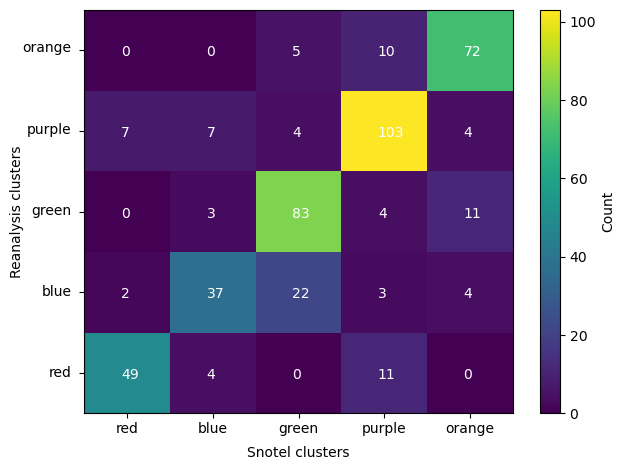

In [133]:
fig, ax = plt.subplots()

BINS = [-0.5,0.5,1.5,2.5,3.5,4.5]

sm = ax.hist2d(stations_1yr[stations_1yr['reanalysis_cluster'] != -1]['cluster'], \
        stations_1yr[stations_1yr['reanalysis_cluster'] != -1]['reanalysis_cluster'], 
               bins=BINS) 

# below code from https://www.reddit.com/r/learnpython/comments/j5bk91/2d_histogram_bin_count/
for ix, x_pos in enumerate(sm[1][0:5]):
    for iy, y_pos in enumerate(sm[2][0:5]):
        label = int(sm[0][ix][iy])
        # print(f"bin({int(x_pos)},{int(y_pos)}): {int(label)}")
        plt.text(x_pos+0.425, y_pos+0.425, label, color='w')

bin_colors = ['red', 'blue','green', 'purple','orange']
for x, label in zip(BINS, bin_colors):
    # Label the raw counts
    ax.annotate(label, xy=(x+0.5, 0.04), xycoords=('data', 'axes fraction'),
        xytext=(0, -18), textcoords='offset points', va='top', ha='center')

for y, label in zip(BINS, bin_colors):
    # Label the raw counts
    ax.annotate(label, xy=(-0.65, (y/4.97 + 0.28)), xycoords=('data', 'axes fraction'),
        xytext=(0, -18), textcoords='offset points', va='top', ha='right')
# for y, label in zip(BINS, bin_colors):    
#     ax.annotate(label, xy=(0.05,y+0.5)), xycoords=('data','axes fraction'), 
#         xytext=(0,-18), textcoords='offset points', va='top', ha='center')
ax.set_xlabel('Snotel clusters',labelpad=20)
ax.set_ylabel('Reanalysis clusters',labelpad=40)
#ax.set_axis_off()
ax.tick_params(labelbottom=False) 
ax.tick_params(labelleft=False) 
cbar = fig.colorbar(sm[3], ax=ax, format=matplotlib.ticker.ScalarFormatter())
cbar.set_label("Count")
plt.tight_layout()
#plt.savefig('../../figures/station_heatmap.jpeg',dpi=300)

### Rerun the above analysis for the reanalysis clustered only on the UCRB:

### Sample the reanalysis cluster data at the location of each snotel:

In [136]:
stations = pickle.load(open('../../data/snv_dataframes/snv_temp_precip_cluster_gdf_snvs.pkl','rb'))

In [147]:
ucrb = pickle.load(open('../../data/misc/ucrb.pkl','rb'))

In [148]:
stations_ucrb = stations.clip(ucrb)

In [149]:
clusters_reanalysis = rxr.open_rasterio('../../data/ucrb_swe_reanalysis_3clusters_8xcoarsened.nc', masked=True).squeeze()

In [150]:
clusters_reanalysis = clusters_reanalysis.rio.write_crs('epsg:4326')

In [151]:
stations_1yr = stations_ucrb[stations_ucrb.index.get_level_values(1)==1990]

In [152]:
xs = stations_1yr.geometry.x.values
ys = stations_1yr.geometry.y.values

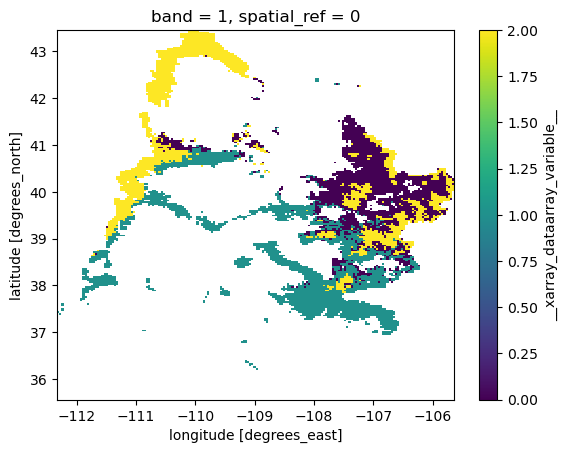

In [153]:
clusters_reanalysis.plot()

In [154]:
sampled_reanalysis_clusters = clusters_reanalysis.interp(x=xs, y=ys, method='nearest').values

In [155]:
stations_1yr['sampled_reanalysis_clusters_ucrb'] = sampled_reanalysis_clusters.diagonal()

/Users/Hannah/micromamba/envs/analysis_2024/lib/python3.12/site-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


<Axes: >

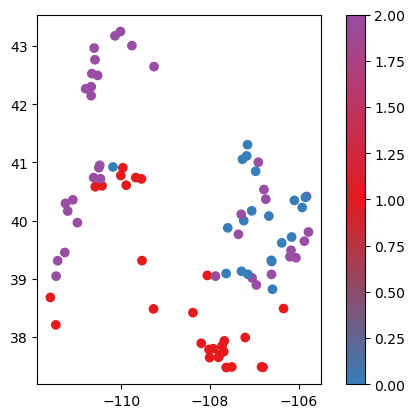

In [159]:
from matplotlib.colors import LinearSegmentedColormap
colors1=['#377eb8','#e41a1c','#984ea3',] #,'#ffff33'
cmap1 = LinearSegmentedColormap.from_list('clusters', colors1)

stations_1yr.plot(column='sampled_reanalysis_clusters_ucrb', facecolor='none', cmap = plt.get_cmap(cmap1, 3), vmin=0,vmax=2, legend=True)

In [160]:
stations_1yr.shape

(85, 31)

In [161]:
stations_1yr.columns

Index(['station_n', 'reanalysis_n', 'elevation_m', 'station_swe',
       'station_swe_mean', 'reanalysis_swe', 'deg_days_0C', 'cold_deg_days',
       'cumulative_precip_m', 'precip_mean', 'precip_std', 'precip_n',
       'log_cumulative_precip_m', 'log_reanalysis_swe', 'log_station_swe',
       'log_precip_mean', 'log_station_swe_mean', 'log_reanalysis_swe_mean',
       'log_precip_std', 'log_station_swe_std', 'log_reanalysis_swe_std',
       'log_precip_n', 'log_station_n', 'log_reanalysis_n', 'latitude',
       'longitude', 'geometry', 'cluster', 'sampled_reanalysis_cluster',
       'reanalysis_cluster', 'sampled_reanalysis_clusters_ucrb'],
      dtype='object')

In [162]:
stations_ucrb['sampled_reanalysis_cluster_ucrb'] = np.nan
for site in stations_1yr.index.get_level_values(0):
    for year in range(1990,2022):
        stations_ucrb.loc[pd.IndexSlice[site, year], 'sampled_reanalysis_cluster_ucrb'] = stations_1yr.loc[stations_1yr.index.get_level_values(0)==site, 'sampled_reanalysis_clusters_ucrb'].values

/Users/Hannah/micromamba/envs/analysis_2024/lib/python3.12/site-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [163]:
stations_ucrb.to_pickle('../../data/snv_dataframes/snv_temp_precip_cluster_gdf_snvs_ucrb.pkl')